#Data Preprocessing

In [1]:
!ls -lh 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo.zip'

-rw-r--r-- 1 aldim 197121 1.4G Nov  9 18:07 G:/Projects Bangkit Isyara-App/MachineLearning/bisindo.zip


In [2]:
import zipfile
import os

# Masukan nama file zip yang akan digunakan
path_zip = 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo.zip'

# Folder untuk menyimpan hasil extract file zip
path_extract = 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo'

# Mengekstrak file zip
with zipfile.ZipFile(path_zip, 'r') as zip_ref:
    zip_ref.extractall(path_extract)

# Menampilkan daftar file yang telah diekstrak
extracted_files = os.listdir(path_extract)
print("File yang telah diekstrak:", extracted_files)

File yang telah diekstrak: ['images']


#Data Exploration

In [3]:
import os
print("Current Directory:", os.getcwd())

Current Directory: G:\Projects Bangkit Isyara-App\MachineLearning\BuildAndTrainModel\CNN


Training Dataset:


Class: A - Sample Quantity: 350
-----------------------------------------------------


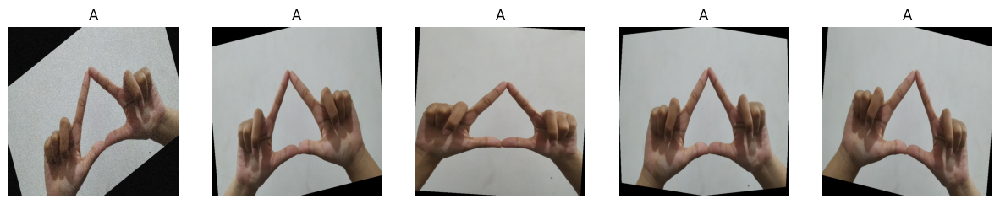

Class: B - Sample Quantity: 351
-----------------------------------------------------


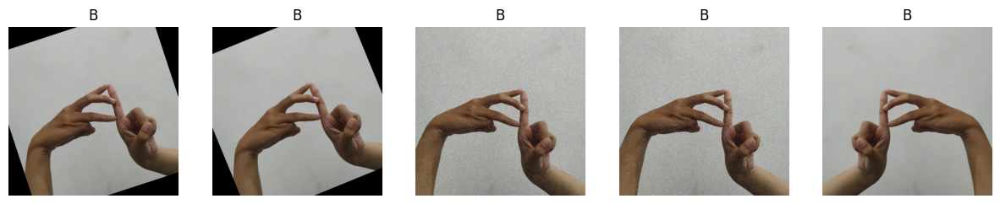

Class: C - Sample Quantity: 343
-----------------------------------------------------


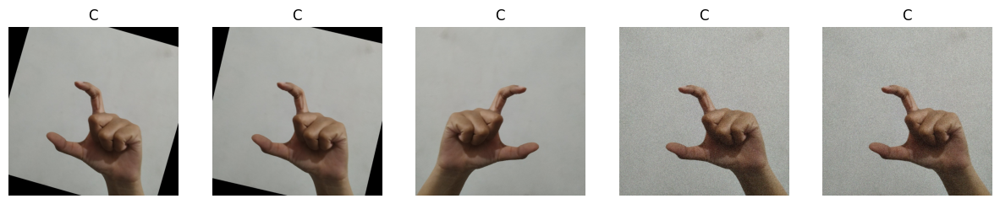

Class: D - Sample Quantity: 348
-----------------------------------------------------


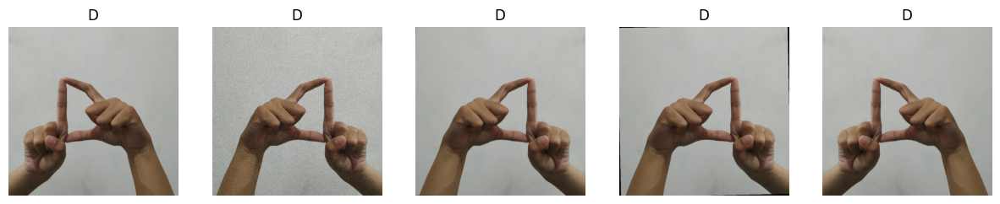

Class: E - Sample Quantity: 352
-----------------------------------------------------


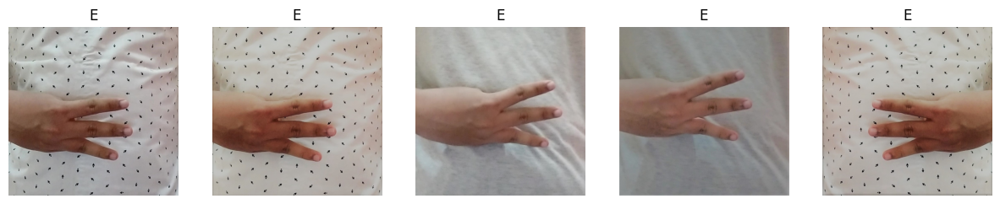

Class: F - Sample Quantity: 357
-----------------------------------------------------


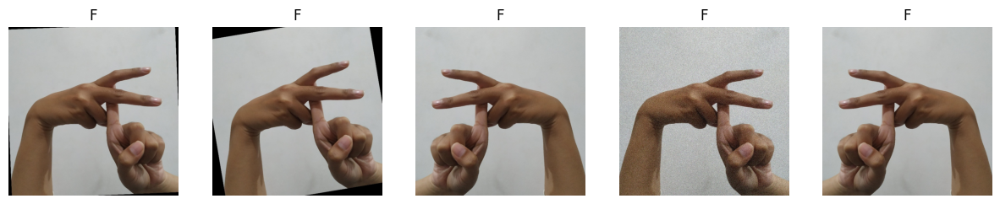

Class: G - Sample Quantity: 360
-----------------------------------------------------


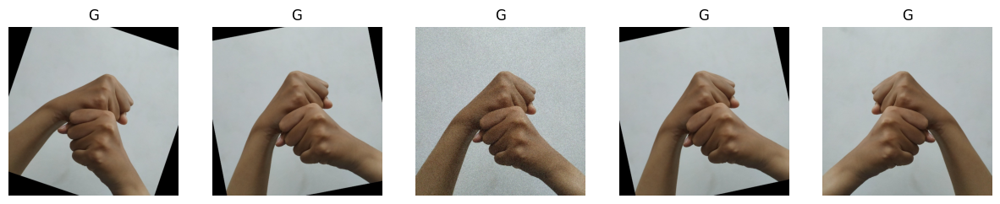

Class: H - Sample Quantity: 348
-----------------------------------------------------


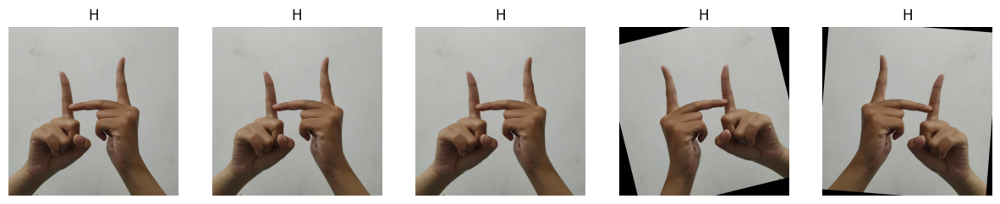

Class: I - Sample Quantity: 360
-----------------------------------------------------


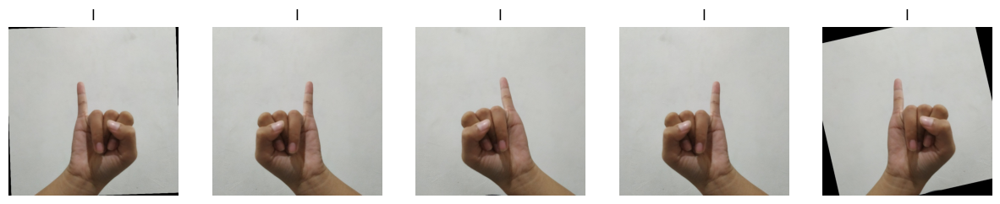

Class: J - Sample Quantity: 360
-----------------------------------------------------


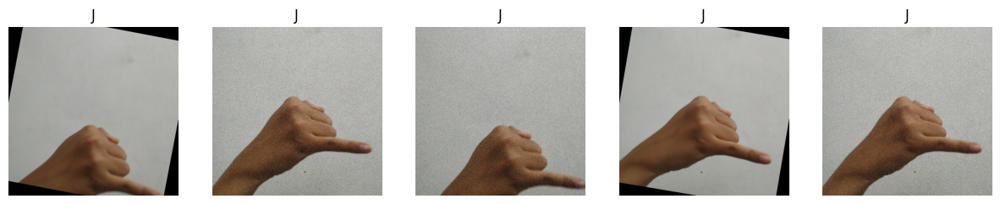

Class: K - Sample Quantity: 348
-----------------------------------------------------


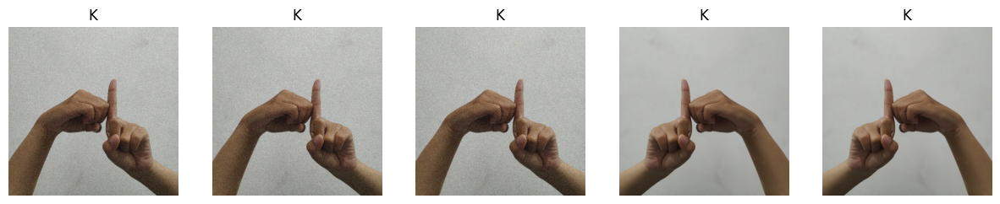

Class: L - Sample Quantity: 357
-----------------------------------------------------


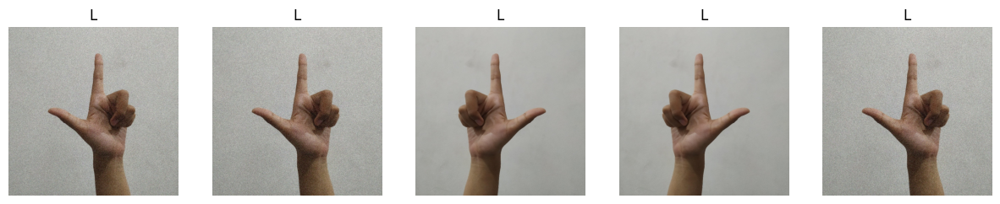

Class: M - Sample Quantity: 355
-----------------------------------------------------


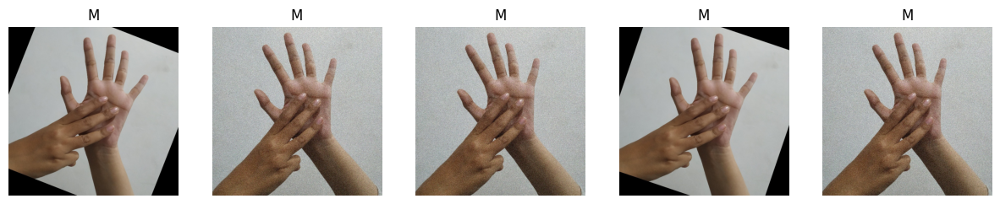

Class: N - Sample Quantity: 350
-----------------------------------------------------


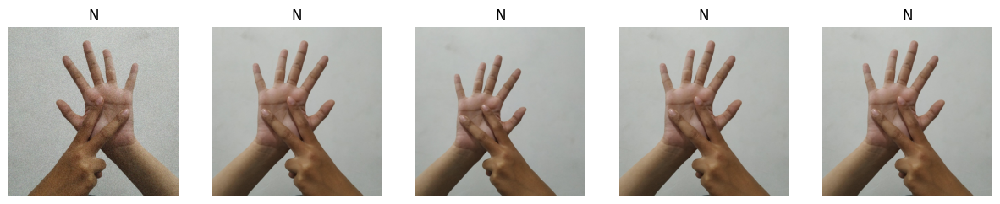

Class: O - Sample Quantity: 357
-----------------------------------------------------


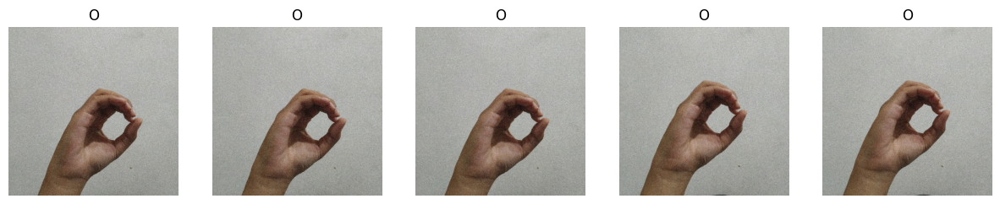

Class: P - Sample Quantity: 357
-----------------------------------------------------


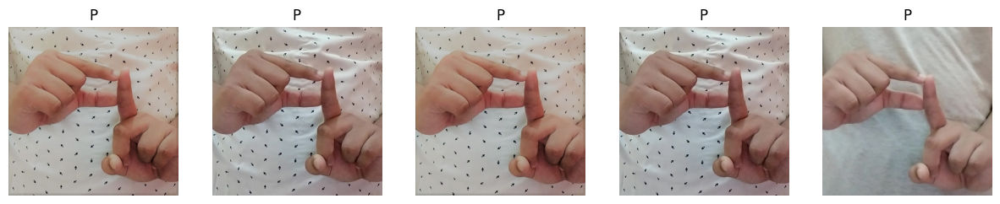

Class: Q - Sample Quantity: 348
-----------------------------------------------------


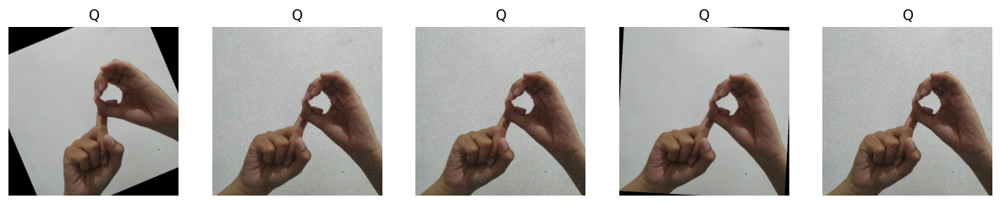

Class: R - Sample Quantity: 350
-----------------------------------------------------


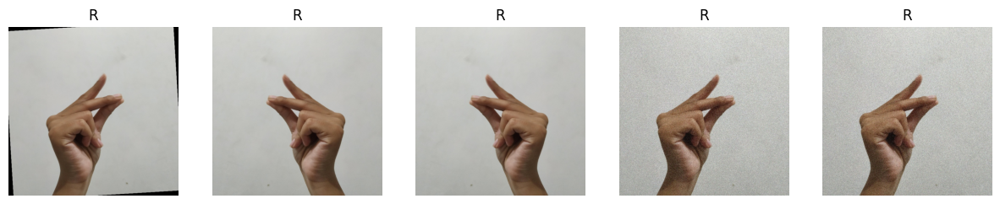

Class: S - Sample Quantity: 343
-----------------------------------------------------


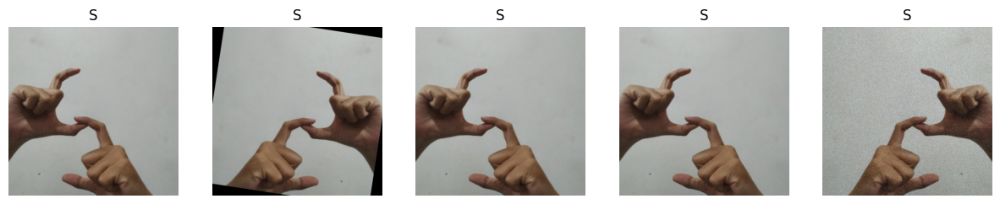

Class: T - Sample Quantity: 360
-----------------------------------------------------


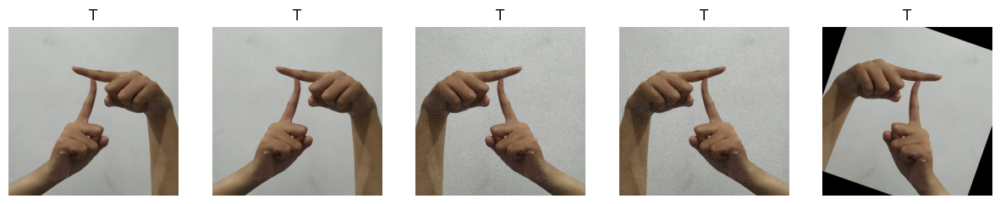

Class: U - Sample Quantity: 355
-----------------------------------------------------


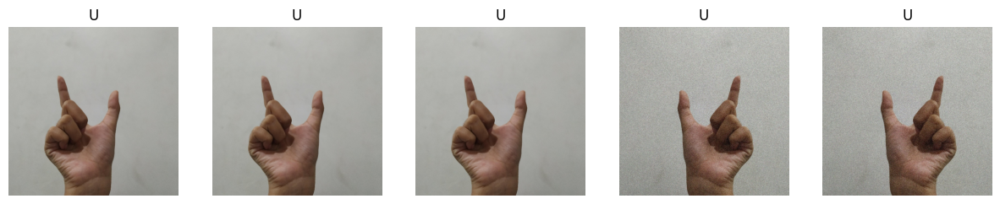

Class: V - Sample Quantity: 357
-----------------------------------------------------


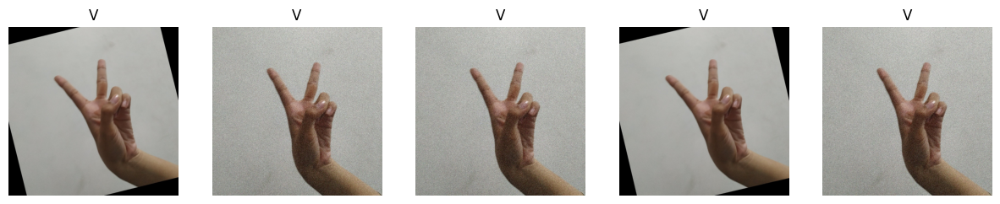

Class: W - Sample Quantity: 360
-----------------------------------------------------


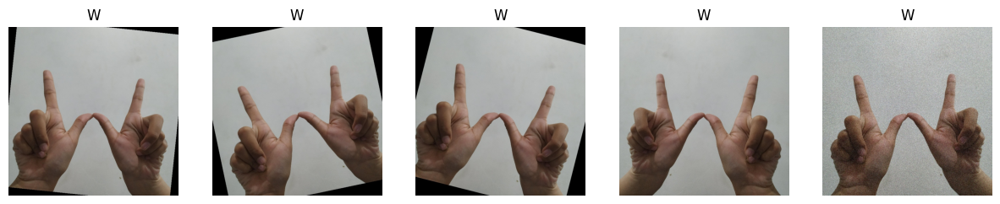

Class: X - Sample Quantity: 355
-----------------------------------------------------


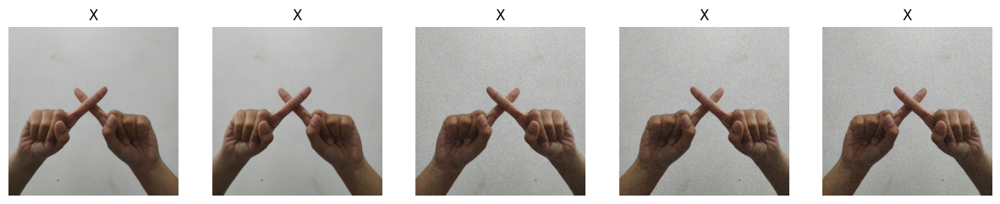

Class: Y - Sample Quantity: 328
-----------------------------------------------------


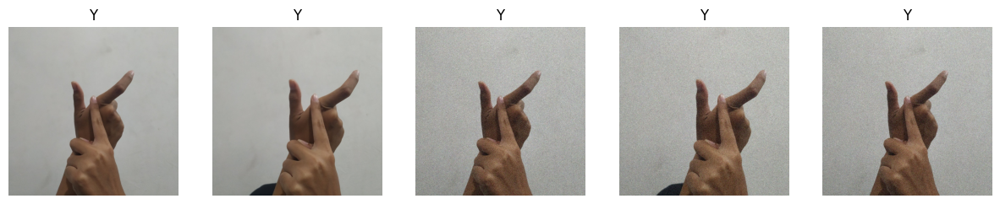

Class: Z - Sample Quantity: 360
-----------------------------------------------------


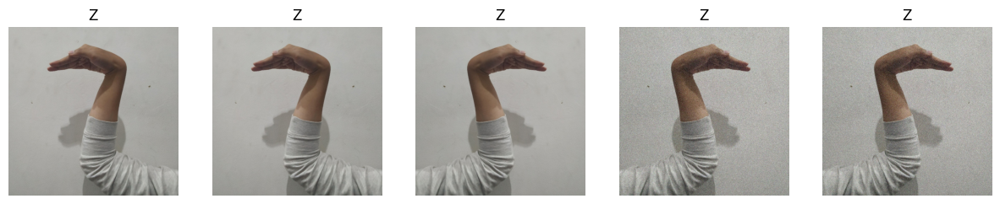


Validation Dataset:


Class: A - Sample Quantity: 88
-----------------------------------------------------


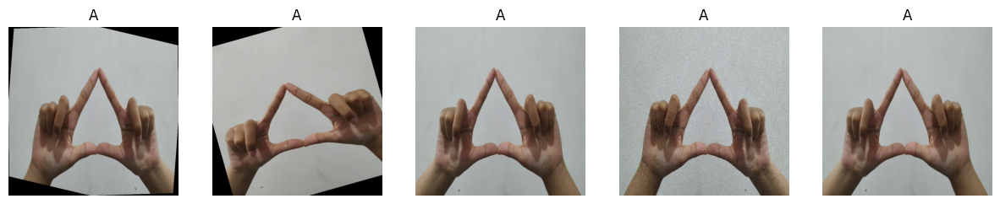

Class: B - Sample Quantity: 88
-----------------------------------------------------


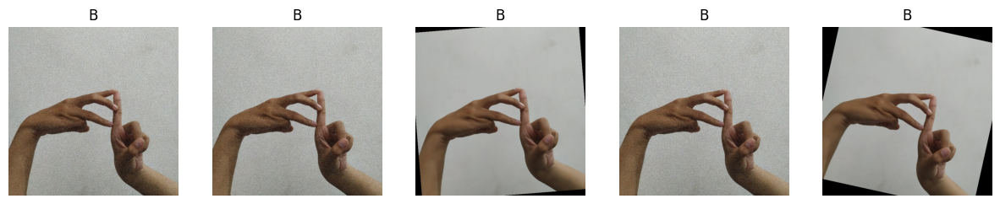

Class: C - Sample Quantity: 86
-----------------------------------------------------


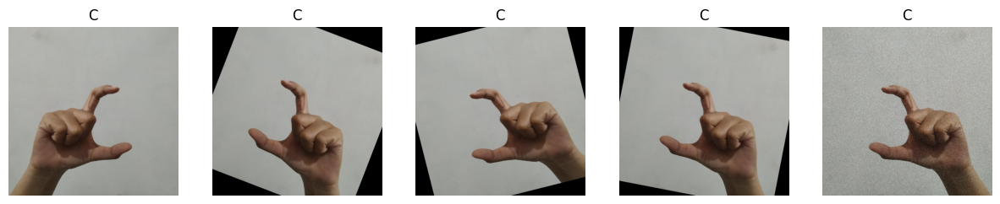

Class: D - Sample Quantity: 87
-----------------------------------------------------


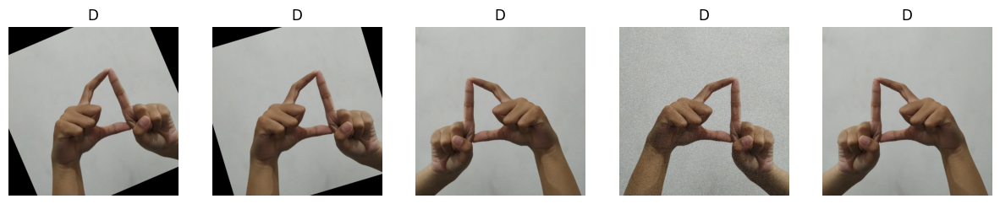

Class: E - Sample Quantity: 89
-----------------------------------------------------


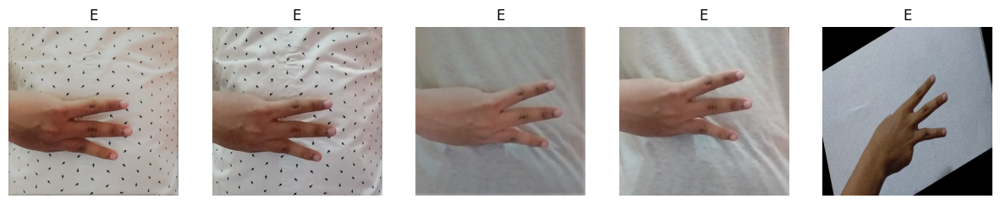

Class: F - Sample Quantity: 90
-----------------------------------------------------


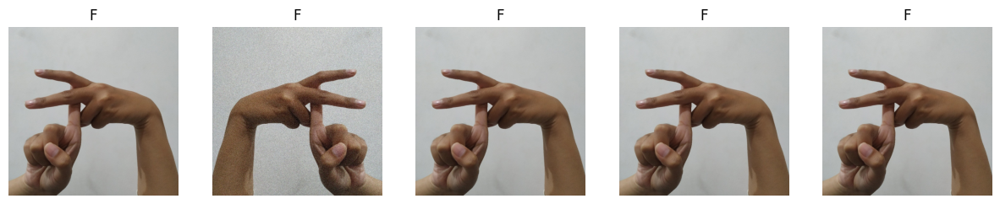

Class: G - Sample Quantity: 90
-----------------------------------------------------


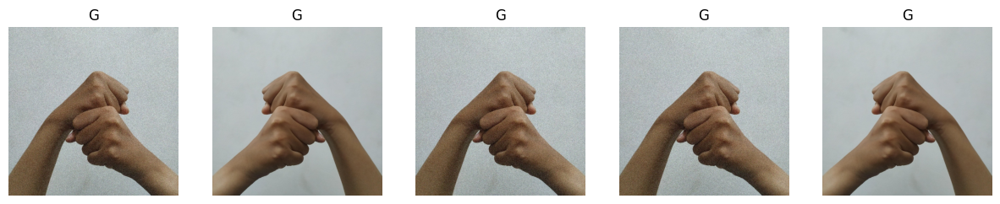

Class: H - Sample Quantity: 87
-----------------------------------------------------


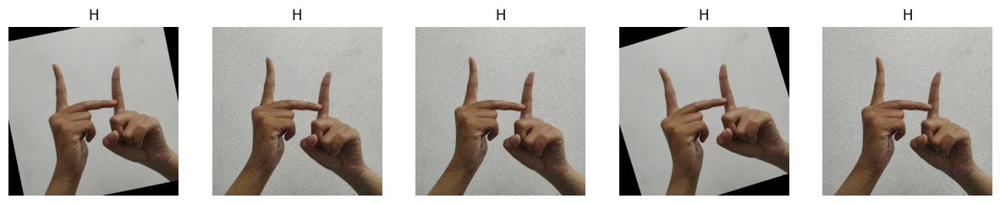

Class: I - Sample Quantity: 90
-----------------------------------------------------


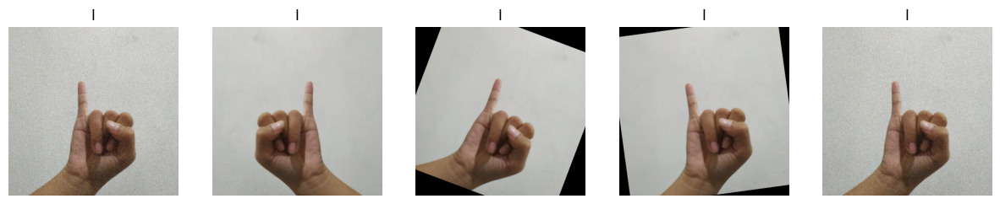

Class: J - Sample Quantity: 90
-----------------------------------------------------


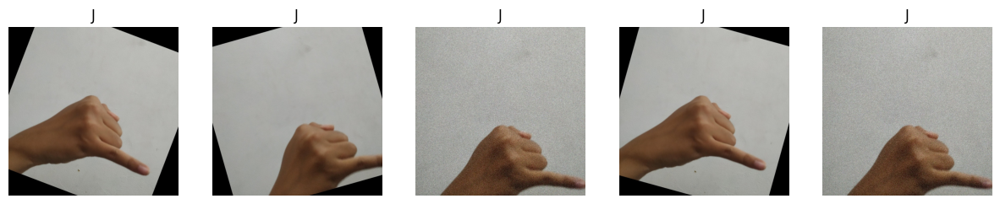

Class: K - Sample Quantity: 87
-----------------------------------------------------


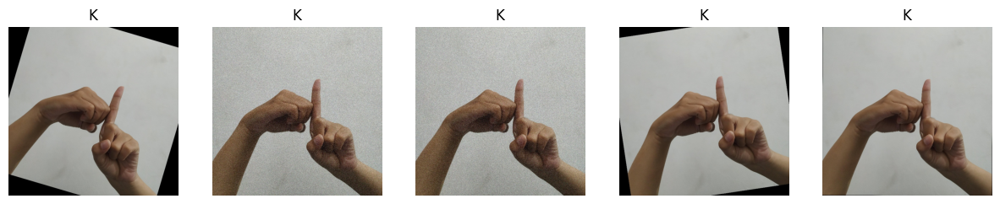

Class: L - Sample Quantity: 90
-----------------------------------------------------


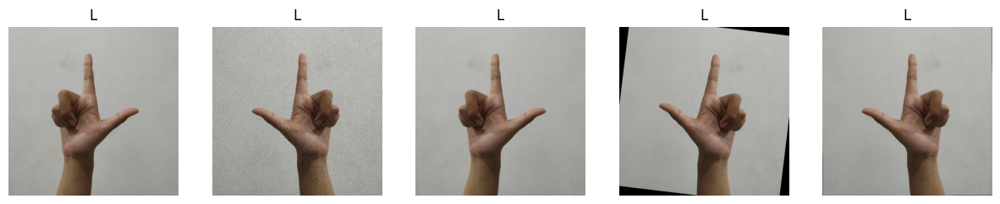

Class: M - Sample Quantity: 89
-----------------------------------------------------


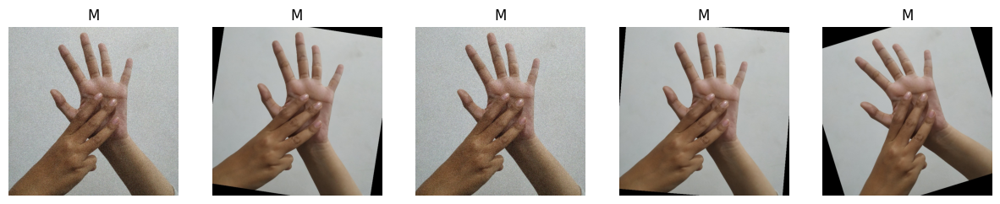

Class: N - Sample Quantity: 88
-----------------------------------------------------


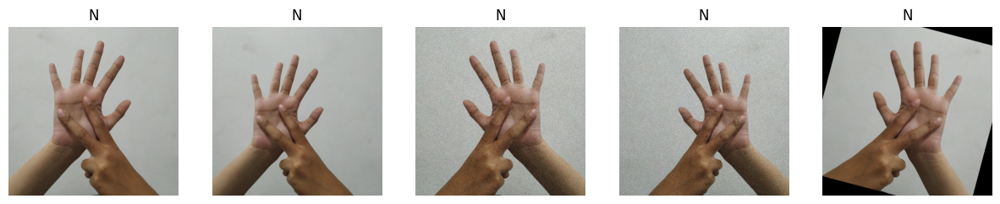

Class: O - Sample Quantity: 90
-----------------------------------------------------


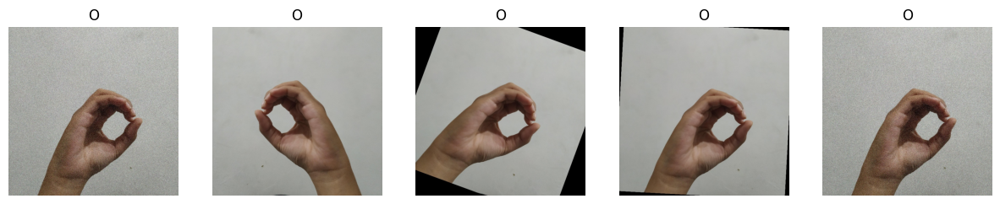

Class: P - Sample Quantity: 90
-----------------------------------------------------


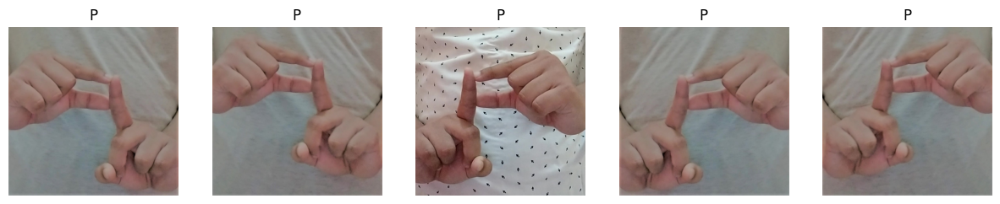

Class: Q - Sample Quantity: 87
-----------------------------------------------------


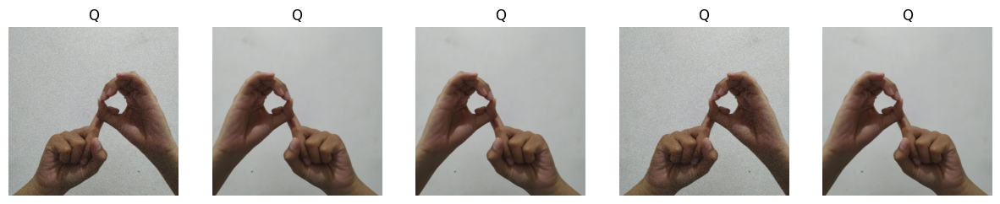

Class: R - Sample Quantity: 88
-----------------------------------------------------


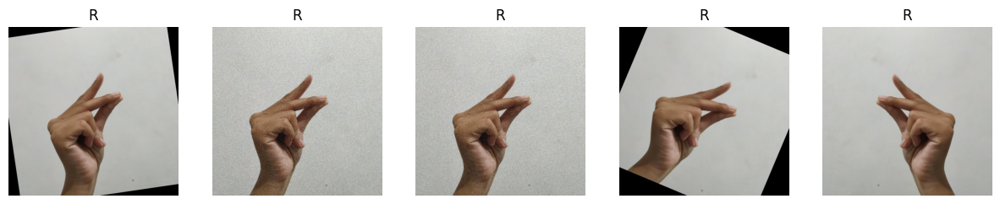

Class: S - Sample Quantity: 86
-----------------------------------------------------


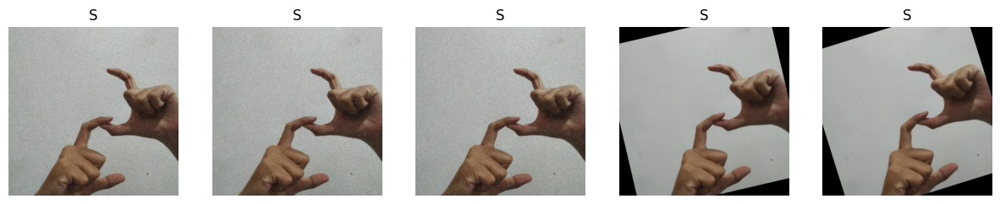

Class: T - Sample Quantity: 90
-----------------------------------------------------


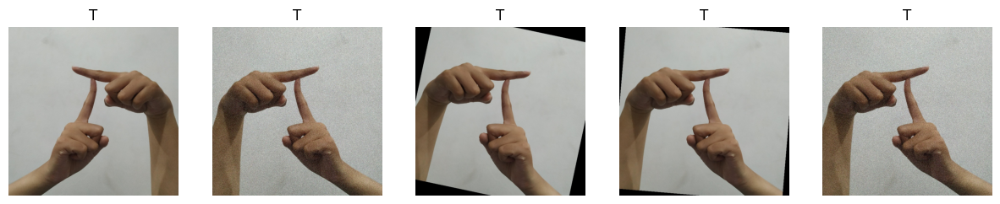

Class: U - Sample Quantity: 89
-----------------------------------------------------


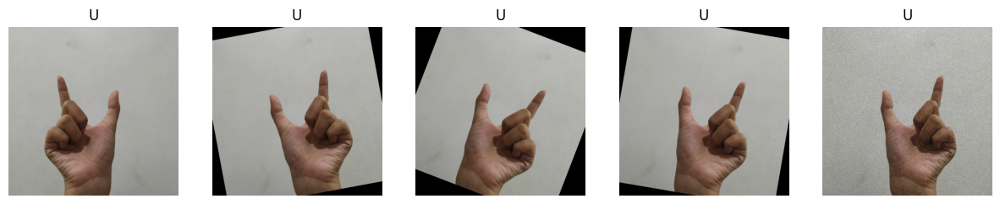

Class: V - Sample Quantity: 90
-----------------------------------------------------


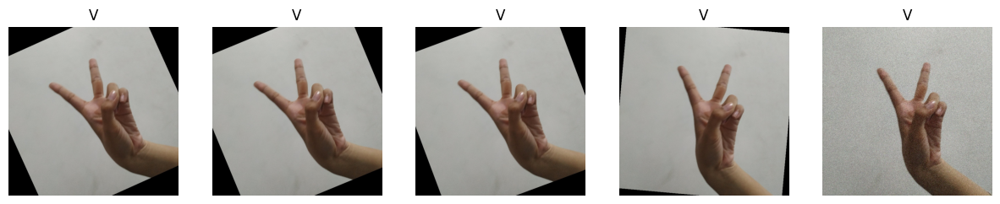

Class: W - Sample Quantity: 90
-----------------------------------------------------


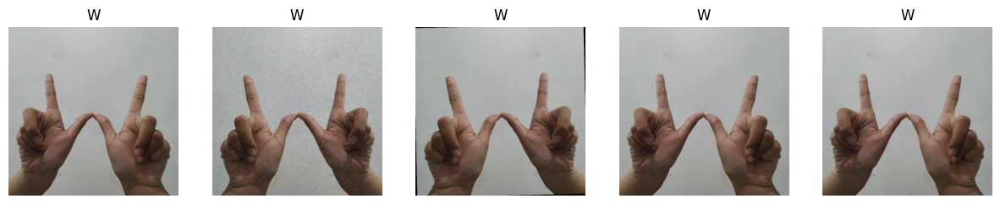

Class: X - Sample Quantity: 89
-----------------------------------------------------


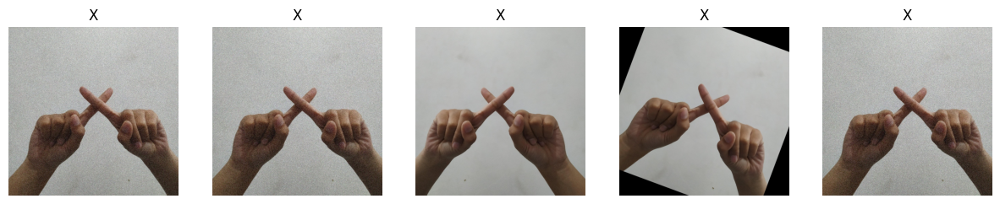

Class: Y - Sample Quantity: 83
-----------------------------------------------------


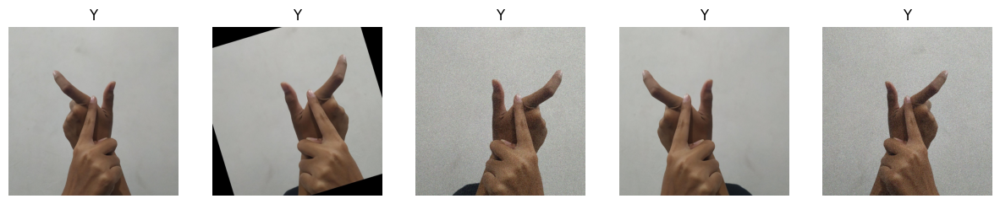

Class: Z - Sample Quantity: 90
-----------------------------------------------------


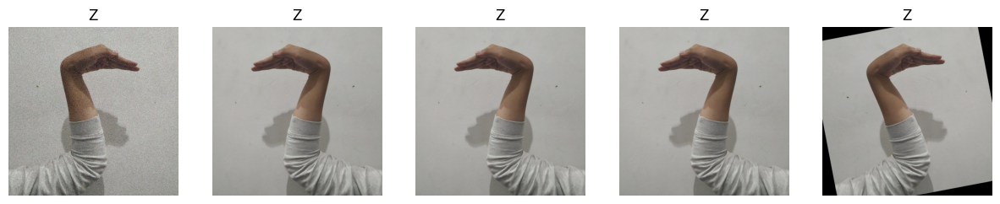

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

BASE_DIR = 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images'

TRAIN_DIR = os.path.join(BASE_DIR, 'train')
VAL_DIR = os.path.join(BASE_DIR, 'val')


#Buat dictionary
train_class_counts = {}
val_class_counts = {}

def display_class_samples(path_dataset, class_counts):
    for class_name in os.listdir(path_dataset):
        class_folder = os.path.join(path_dataset, class_name)
        #Loop folder
        if os.path.isdir(class_folder):
            # Menghitung jumlah gambar per kelas
            num_images = len(os.listdir(class_folder))
            class_counts[class_name] = num_images

            # Menampilkan gambar acak per kelas
            print(f'Class: {class_name} - Sample Quantity: {num_images}')
            print('-----------------------------------------------------')
            plt.figure(figsize=(15, 10))
            for i, image_file in enumerate(os.listdir(class_folder)[:5]):
                image_path = os.path.join(class_folder, image_file)
                plt.subplot(1, 5, i + 1)
                image = mpimg.imread(image_path)
                plt.imshow(image)
                plt.title(class_name)
                plt.axis('off')
            plt.show()

# Tampilkan jumlah dan contoh gambar pada dataset train
if os.path.exists(TRAIN_DIR):
    print('Training Dataset:')
    print('\n')
    display_class_samples(TRAIN_DIR, train_class_counts)
else:
    print('Folder train tidak ditemukan.')

# Tampilkan jumlah dan contoh gambar pada dataset train
if os.path.exists(VAL_DIR):
    print('\nValidation Dataset:')
    print('\n')
    display_class_samples(VAL_DIR, val_class_counts)
else:
    print('Folder val tidak ditemukan.')

In [5]:
import os
import cv2
import numpy as np
from imutils import paths

#Menghitung hash gambar menggunakan metode dhash
def dhash(image, hashSize=8):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(gray, (hashSize + 1, hashSize))
    diff = resized[:, 1:] > resized[:, :-1]
    return sum([2 ** i for (i, v) in enumerate(diff.flatten()) if v])

#Menentukan direktori dataset dan pengaturan menghapus gambar duplikat 
dataset_dir = 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images'
remove_duplicates = True

#Menghitung hash masing-masing gambar
print('[INFO] computing image hashes...')
imagePaths = list(paths.list_images(dataset_dir))
hashes = {}

#Loop memproses gambar yang ada di dataset
for imagePath in imagePaths:
    image = cv2.imread(imagePath)
    img_hash = dhash(image)
    img_list = hashes.get(img_hash, [])
    img_list.append(imagePath)
    hashes[img_hash] = img_list

#Loop untuk menemukan duplikat dan menghapus gambar duplikat
for (img_hash, duplicatePaths) in hashes.items():
    if len(duplicatePaths) > 1:
        if not remove_duplicates:
            montage = None
            for path in duplicatePaths:
                image = cv2.imread(path)
                image = cv2.resize(image, (150, 150))
                if montage is None:
                    montage = image
                else:
                    montage = np.hstack([montage, image])
            print(f"[INFO] hash: {img_hash}")
            cv2.imshow('Montage', montage)
            cv2.waitKey(0)
        else:
            for duplicate_path in duplicatePaths[1:]:
                os.remove(duplicate_path)
                print(f"[INFO] Removed duplicate: {duplicate_path}")


[INFO] computing image hashes...
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\flip005.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\flip059.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\flip093.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\augmented_image_61.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\val\A\augmented_image_92.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\augmented_image_45.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\augmented_image_48.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images\train\A\flip000.jpg
[INFO] Removed duplicate: G:/Projects Bangkit Isyara-App/Mach

In [6]:
duplicate_count = 0

for (img_hash, duplicatePaths) in hashes.items():
    if len(duplicatePaths) > 1:
        duplicate_count += len(duplicatePaths) - 1

# Menampilkan jumlah total gambar duplikat yang telah dihapus
print(f"Total gambar duplikat yang dihapus: {duplicate_count}")

Total gambar duplikat yang dihapus: 1581


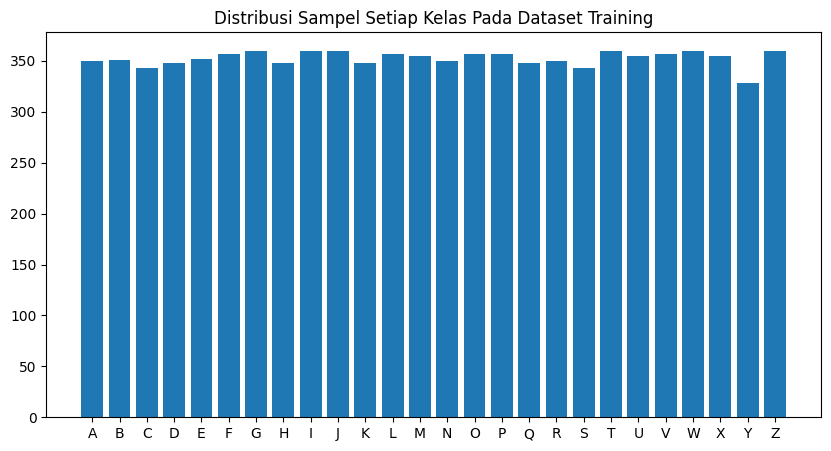

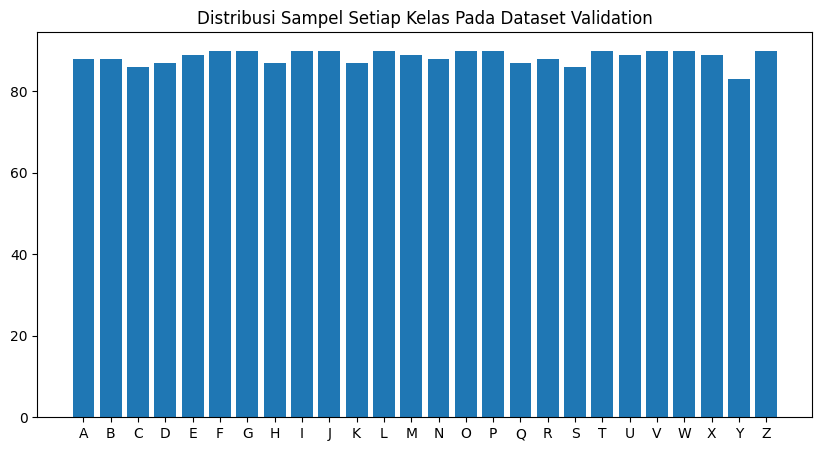

In [7]:
# Tampilkan distribusi sampel setiap kelas untuk dataset training
plt.figure(figsize=(10, 5))
plt.bar(train_class_counts.keys(), train_class_counts.values())
plt.title('Distribusi Sampel Setiap Kelas Pada Dataset Training')
plt.xticks(rotation=0)
plt.show()

# Tampilkan distribusi sampel setiap kelas untuk dataset validation
plt.figure(figsize=(10, 5))
plt.bar(val_class_counts.keys(), val_class_counts.values())
plt.title('Distribusi Sampel Setiap Kelas Pada Dataset Validation')
plt.xticks(rotation=0)
plt.show()

#Data Normalization

In [3]:
import tensorflow as tf

print(tf.__version__)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPU terdeteksi: {len(gpus)} unit")
    for gpu in gpus:
        print(gpu)
else:
    print("Tidak ada GPU yang terdeteksi.")
    

2.10.1
GPU terdeteksi: 1 unit
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [4]:
# Path ke folder dataset
TRAINING_DIR = 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images/train'
VAL_DIR = 'G:/Projects Bangkit Isyara-App/MachineLearning/bisindo/images/val'

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    TRAINING_DIR,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    VAL_DIR,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
)


normalization_layer = tf.keras.layers.Rescaling(1./255)
train_dataset = train_dataset.map(lambda x, y: (normalization_layer(x), y))
val_dataset = val_dataset.map(lambda x, y: (normalization_layer(x), y))

Found 7953 files belonging to 26 classes.
Found 1936 files belonging to 26 classes.


In [5]:
SHUFFLE_BUFFER_SIZE = 100
PREFETCH_BUFFER_SIZE = tf.data.AUTOTUNE

train_dataset_prepared = (train_dataset
                       .shuffle(SHUFFLE_BUFFER_SIZE)
                       .cache()
                       .prefetch(PREFETCH_BUFFER_SIZE)
                       )

val_dataset_prepared = (val_dataset
                      .shuffle(SHUFFLE_BUFFER_SIZE)
                      .cache()
                      .prefetch(PREFETCH_BUFFER_SIZE)
                    )

#Modeling using CNN 4 Layers

In [11]:
# Mendefinisikan CNN Model 4 Layers
model = tf.keras.models.Sequential([
    tf.keras.Input(shape=IMAGE_SIZE + (3,)),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(26, activation='softmax')
])

model.summary()

model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(0.0001),
    metrics=['accuracy']
)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 26, 26, 128)     

In [12]:
history = model.fit (
    train_dataset_prepared,
    validation_data = val_dataset_prepared,
    epochs=25
)

Epoch 1/25
249/249 [==============================] - 25s 98ms/step - loss: 2.9758 - accuracy: 0.1466 - val_loss: 1.9888 - val_accuracy: 0.5108
Epoch 2/25
249/249 [==============================] - 24s 98ms/step - loss: 1.9528 - accuracy: 0.4271 - val_loss: 1.3152 - val_accuracy: 0.6699
Epoch 3/25
249/249 [==============================] - 25s 99ms/step - loss: 1.5974 - accuracy: 0.5295 - val_loss: 1.1320 - val_accuracy: 0.6890
Epoch 4/25
249/249 [==============================] - 25s 99ms/step - loss: 1.4439 - accuracy: 0.5662 - val_loss: 1.0810 - val_accuracy: 0.7061
Epoch 5/25
249/249 [==============================] - 24s 98ms/step - loss: 1.3160 - accuracy: 0.5978 - val_loss: 1.0023 - val_accuracy: 0.7159
Epoch 6/25
249/249 [==============================] - 24s 98ms/step - loss: 1.2065 - accuracy: 0.6217 - val_loss: 0.9570 - val_accuracy: 0.7392
Epoch 7/25
249/249 [==============================] - 25s 99ms/step - loss: 1.1309 - accuracy: 0.6502 - val_loss: 0.9099 - val_accuracy:

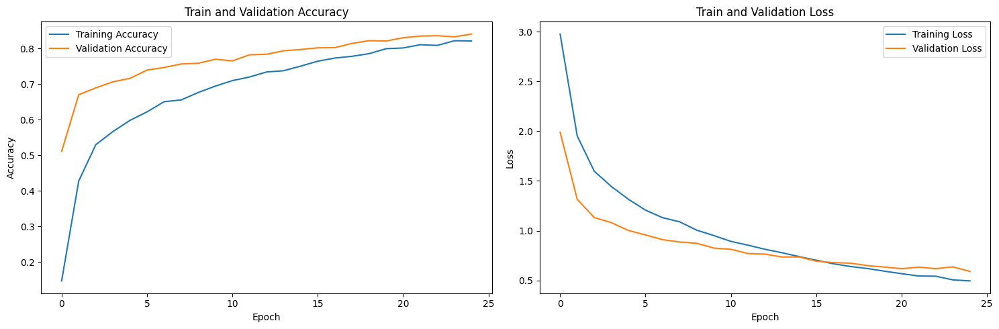

In [13]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(15, 5)) 

# Plot Accuracy
axes[0].plot(history.history['accuracy'], label='Training Accuracy')
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
axes[0].set_title('Train and Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

# Plot Loss
axes[1].plot(history.history['loss'], label='Training Loss')
axes[1].plot(history.history['val_loss'], label='Validation Loss')
axes[1].set_title('Train and Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()

plt.tight_layout()  
plt.show()